In [123]:
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data

from pandas import *
from PIL import Image
from skimage import io
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE

In [244]:
import pickle
clusters = pickle.load(open("../outputs/clusters.txt","rb"))
img_clusters = {}
for c in clusters.keys():
    for img in clusters[c]:
        img_clusters[img] = c
        
clustersdf = DataFrame.from_dict(img_clusters, orient='index')
clustersdf.columns = ['cluster']

In [249]:
clustersdf.head()

,cluster
B009XSN76O,19
B0092OQN4C,16
B0041OH7WK,24
B005IYS5ZA,7
B007KHXTXQ,15


In [4]:
df = read_csv('features_women.csv', index_col='asin')

In [5]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
asin,,,,,,,,,,,,,,,,,,,,,
B005IYS5ZA,0.0,0.8051,0.0000,0.0,0.000,0.1,0.0000,0.3484,0.0000,1.3334,...,0.0000,0.0,0.0,0.0,0.0000,3.2731,0.0,0.0507,0.0,0.0000
B007KHXTXQ,0.0,0.0000,2.9935,0.0,1.199,0.0,0.0000,0.0000,2.8597,0.0000,...,0.0000,0.0,0.0,0.0,2.6146,0.0000,0.0,0.0201,0.0,0.0000
B00IA6VTO2,0.0,3.2722,0.0000,0.0,0.000,0.0,0.3835,0.0000,0.0000,0.0000,...,3.5435,0.0,0.0,0.0,0.0000,0.7942,0.0,0.0000,0.0,0.0000
B0091UELGO,0.0,0.0000,0.0000,0.0,0.000,0.0,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0,0.0,0.0,0.0000,0.0753,0.0,0.0000,0.0,2.6916
B006CB31NO,0.0,0.0000,0.0000,0.0,0.000,0.0,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0,0.0,0.0,0.0000,1.2655,0.0,0.0000,0.0,3.5446


In [7]:
X = df.values

In [8]:
model = TSNE(n_components=2, random_state=0)
np.set_printoptions(suppress=True)
output = model.fit_transform(X)

array([[  7.00059697,   1.50518587],
       [ 10.20792137,   5.4268569 ],
       [  5.70589813,  -0.21709   ],
       ..., 
       [ -6.6666012 ,   1.36191843],
       [ -4.39224591,   5.53427643],
       [ -7.16687385,  -2.70032223]])

In [29]:
tsne_output = {}
for n, i in enumerate(output):
    asin = df.index[n]
    tsne_output[asin] = i

In [252]:
tsne = DataFrame.from_dict(tsne_output, orient='index')
tsne.columns = ['x','y']

In [253]:
meta = read_csv('metadata_women.csv')\
           .loc[:, ['asin','imUrl']]\
           .set_index('asin')

In [254]:
tsne = tsne.merge(meta, left_index=True, right_index=True)

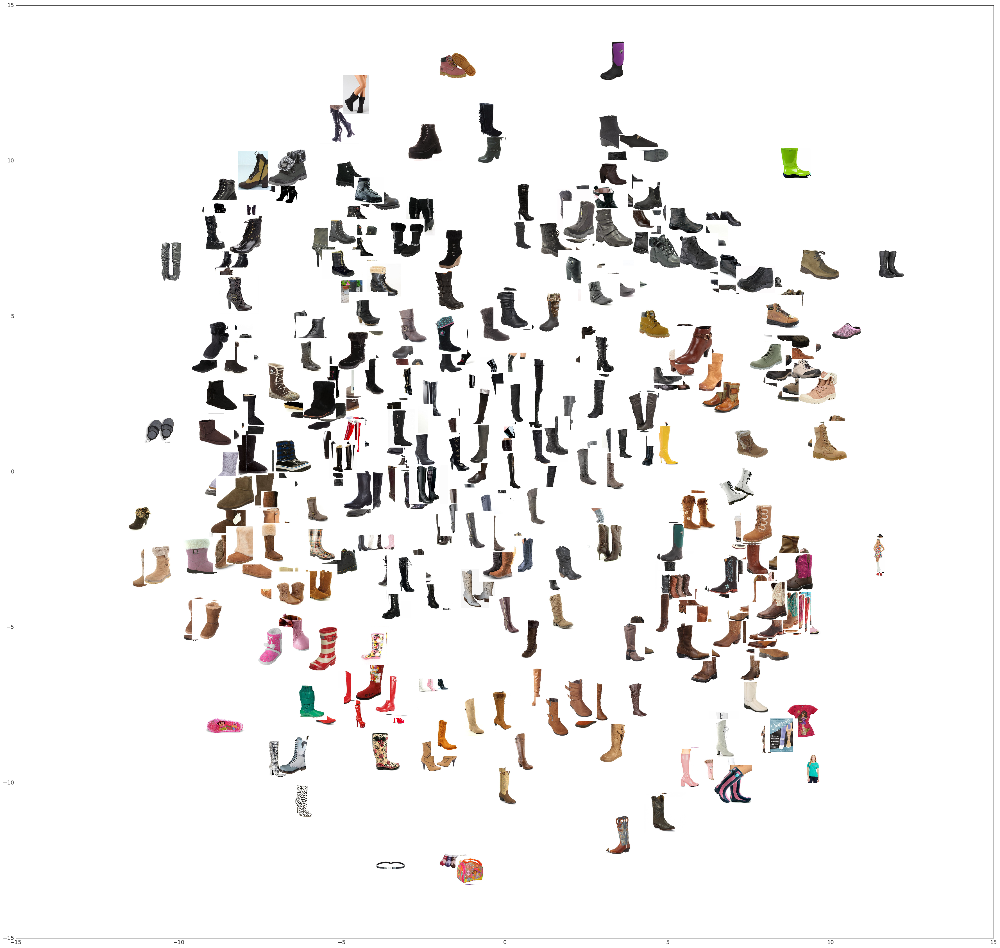

In [255]:
plt.style.use('seaborn-white')

zoom = 0.35
nimages = 500

tsne.sample(frac=1)
asins = tsne.index[:nimages]
x = tsne.loc[asins, 'x'].values
y = tsne.loc[asins, 'y'].values
imgs = [io.imread(u) for u in tsne.loc[asins, 'imUrl'].values]

fig, ax = plt.subplots(figsize=(40,40), dpi=400)

url = tsne.loc[asin, 'imUrl']
image = io.imread(url)

x, y = np.atleast_1d(x, y)
artists = []

for x0, y0, img in zip(x, y, imgs):
    im = OffsetImage(img, zoom=zoom)
    ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
    artists.append(ax.add_artist(ab))
ax.update_datalim(np.column_stack([x, y]))
ax.autoscale()

plt.show()

In [76]:
## show by cluster on t-SNE plot

In [256]:
# kmeans = KMeans(n_clusters=20, random_state=0).fit(X)
# tsne.loc[:, 'cluster'] = kmeans.predict(X)
tsne = tsne.merge(clustersdf, left_index=True, right_index=True)

In [257]:
tsne.head()

,x,y,imUrl,cluster
B0041OH7WK,-1.475751,-1.526725,http://ecx.images-amazon.com/images/I/41UKNd3k...,24
B005IYS5ZA,7.000597,1.505186,http://ecx.images-amazon.com/images/I/51YMg47z...,7
B007KHXTXQ,10.207921,5.426857,http://ecx.images-amazon.com/images/I/314KD6aO...,15
B0091UELGO,-2.641362,6.734964,http://ecx.images-amazon.com/images/I/41uJFblr...,9
B006CB31NO,2.733201,-2.236486,http://ecx.images-amazon.com/images/I/41HbhnIa...,18


In [258]:
def tsne_plot(clusternum, nimages, zoom):
    plt.style.use('seaborn-white')

    tsne.sample(frac=1)
    asins = tsne[tsne.loc[:, 'cluster'] == clusternum].index[:nimages]
    x = tsne.loc[asins, 'x'].values
    y = tsne.loc[asins, 'y'].values
    imgs = [io.imread(u) for u in tsne.loc[asins, 'imUrl'].values]

    fig, ax = plt.subplots(figsize=(40,40), dpi=400)

    url = tsne.loc[asin, 'imUrl']
    image = io.imread(url)

    x, y = np.atleast_1d(x, y)
    artists = []

    for x0, y0, img in zip(x, y, imgs):
        im = OffsetImage(img, zoom=zoom)
        ab = AnnotationBbox(im, (x0, y0), xycoords='data', frameon=False)
        artists.append(ax.add_artist(ab))
    ax.update_datalim(np.column_stack([x, y]))
    ax.autoscale()

    plt.show()

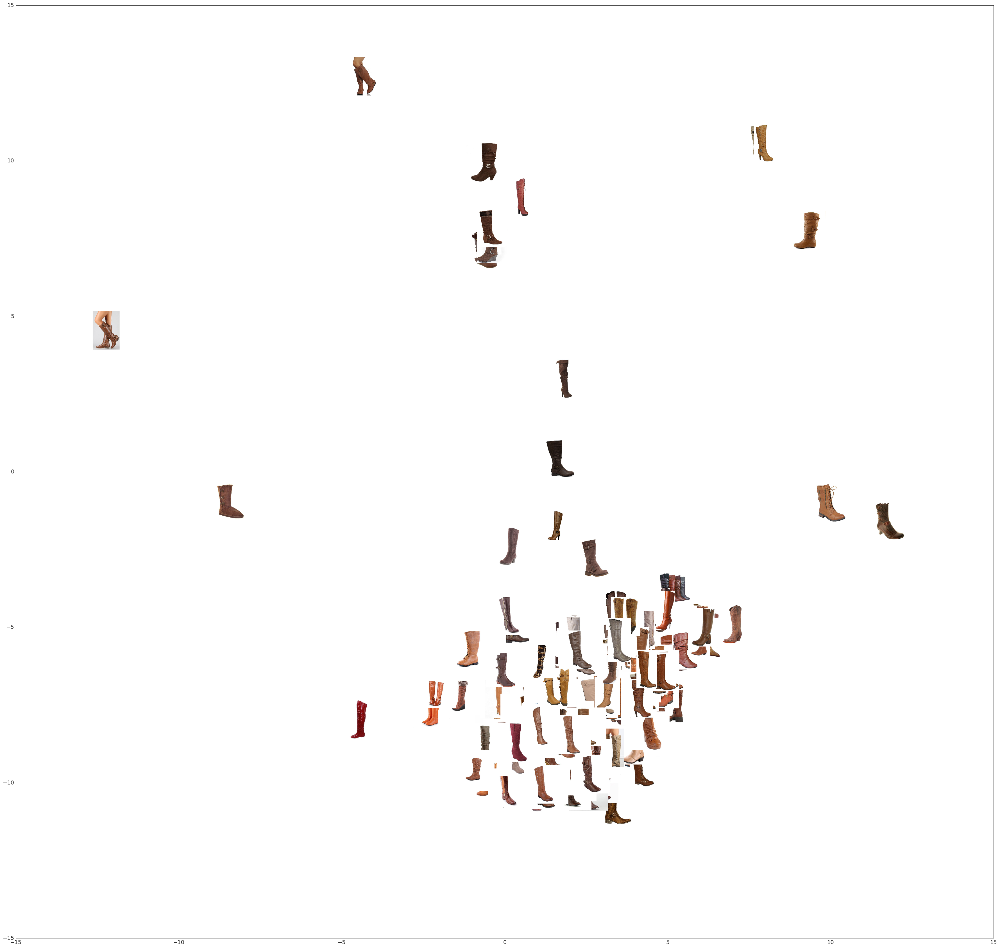

In [259]:
clusternum = 0
zoom = 0.35
nimages = 500

tsne_plot(clusternum, nimages, zoom)

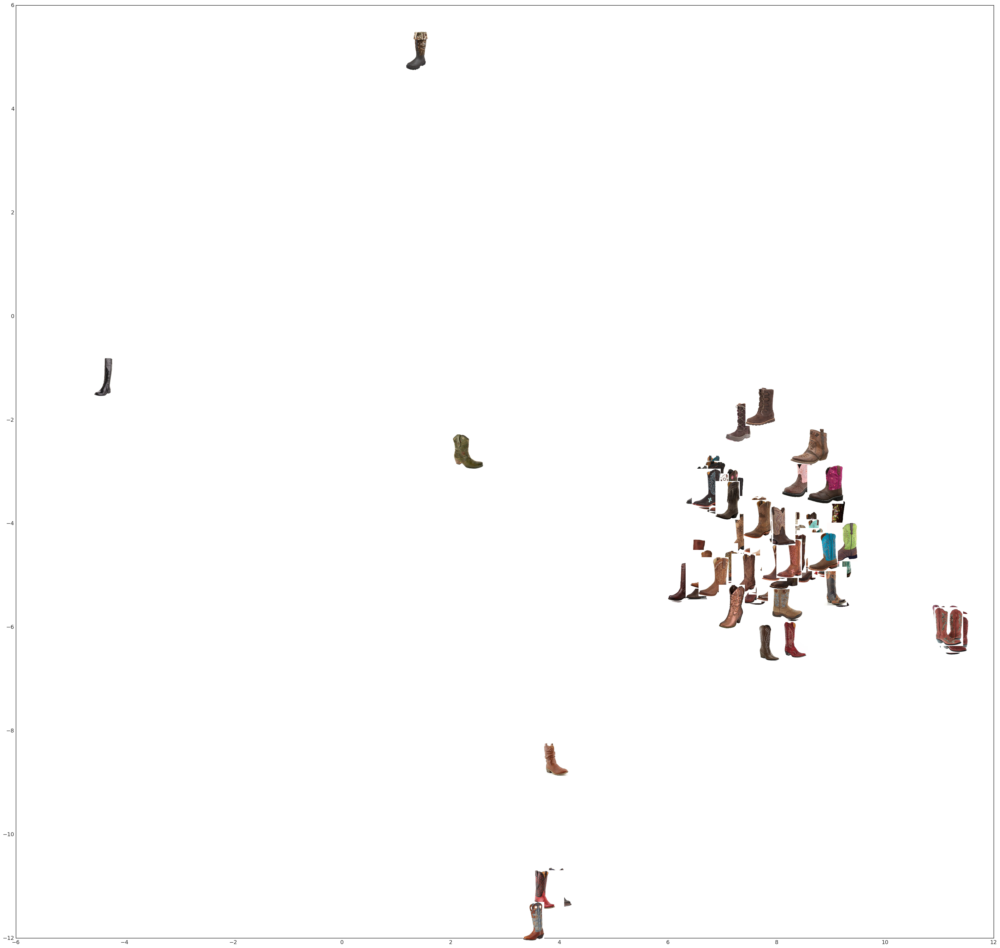

In [260]:
clusternum = 1
zoom = 0.35
nimages = 500

tsne_plot(clusternum, nimages, zoom)

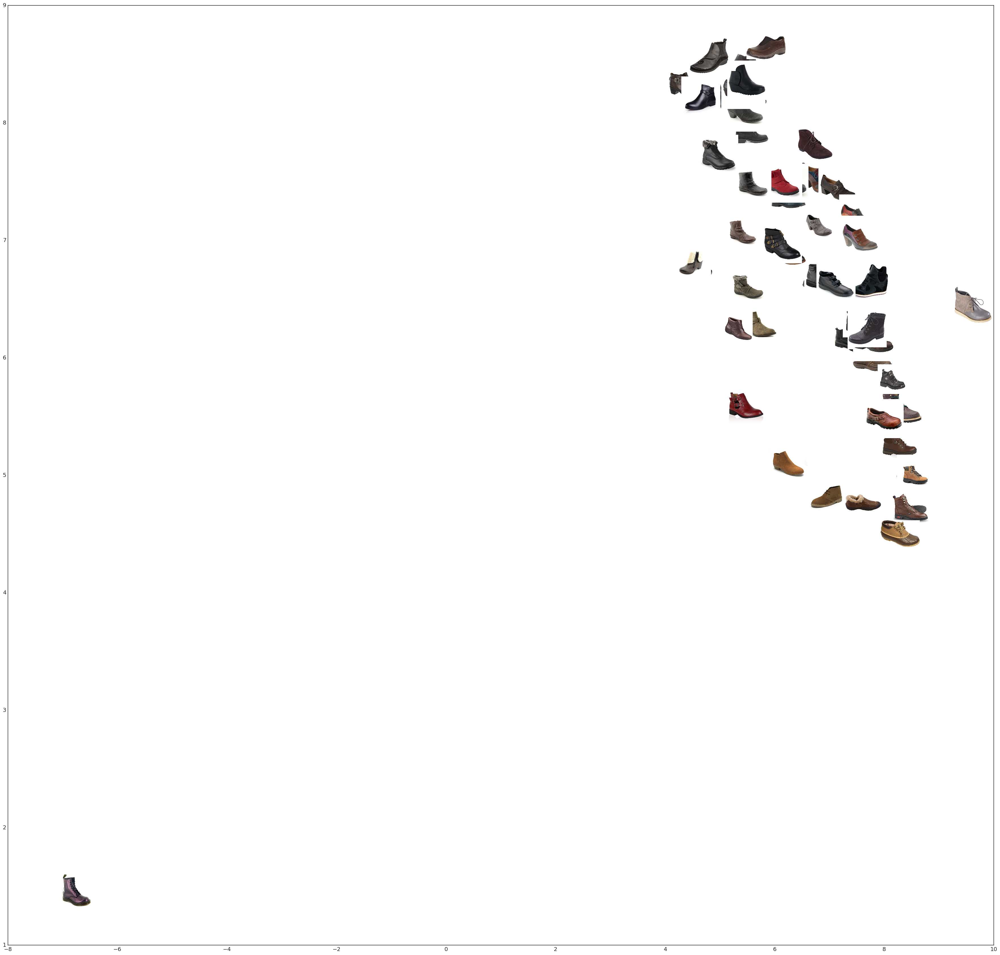

In [261]:
clusternum = 2
zoom = 0.35
nimages = 500

tsne_plot(clusternum, nimages, zoom)

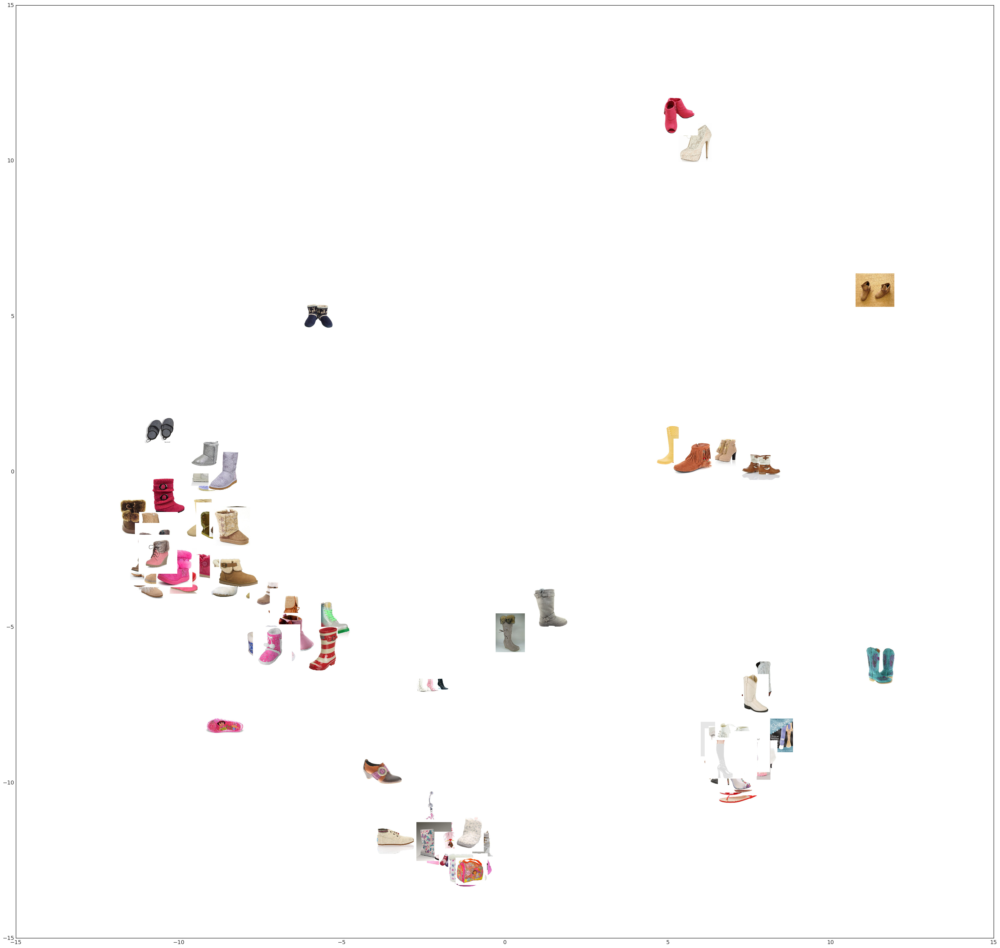

In [262]:
clusternum = 3
zoom = 0.35
nimages = 500

tsne_plot(clusternum, nimages, zoom)

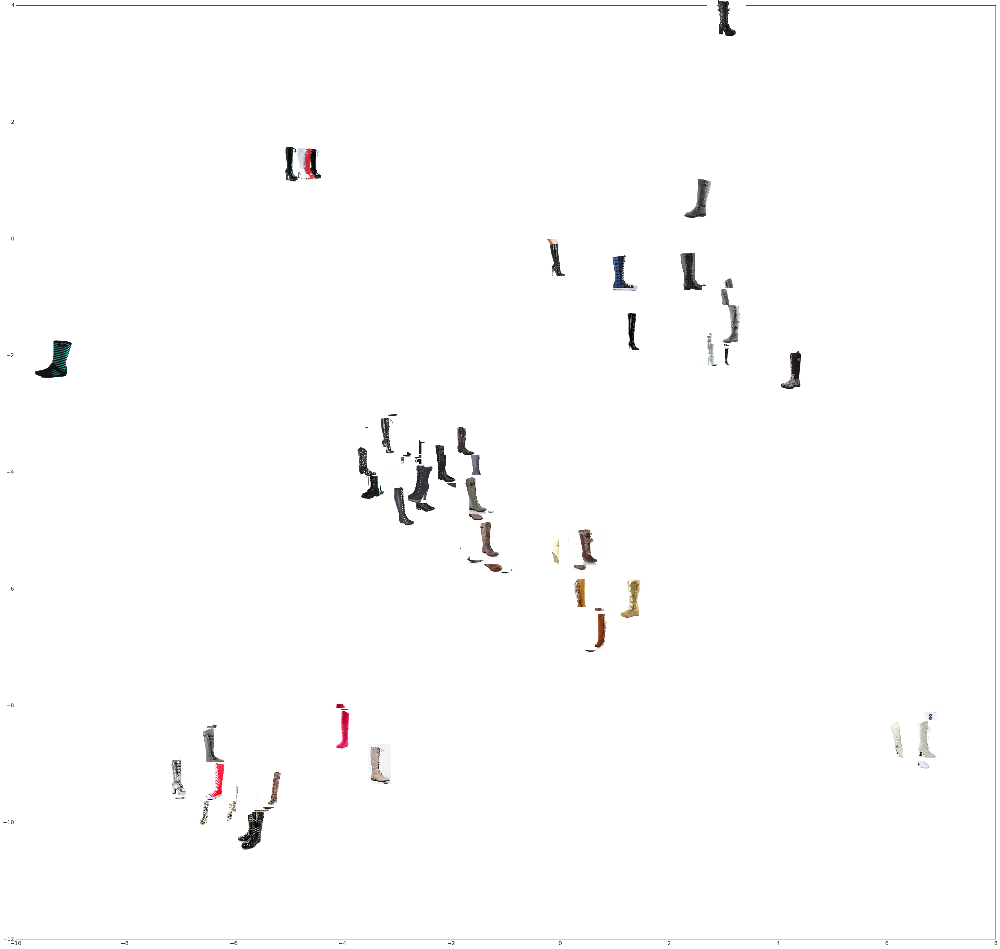

In [263]:
clusternum = 4
zoom = 0.35
nimages = 500

tsne_plot(clusternum, nimages, zoom)

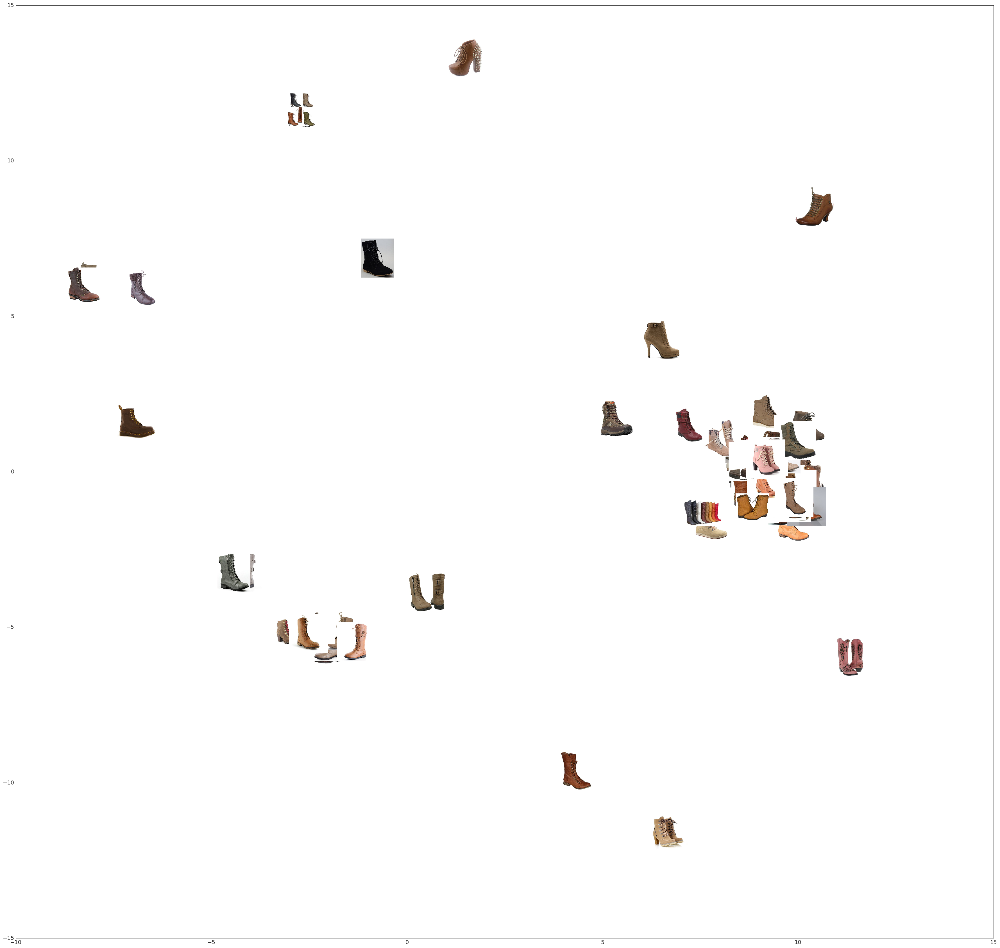

In [264]:
clusternum = 5
zoom = 0.35
nimages = 500

tsne_plot(clusternum, nimages, zoom)

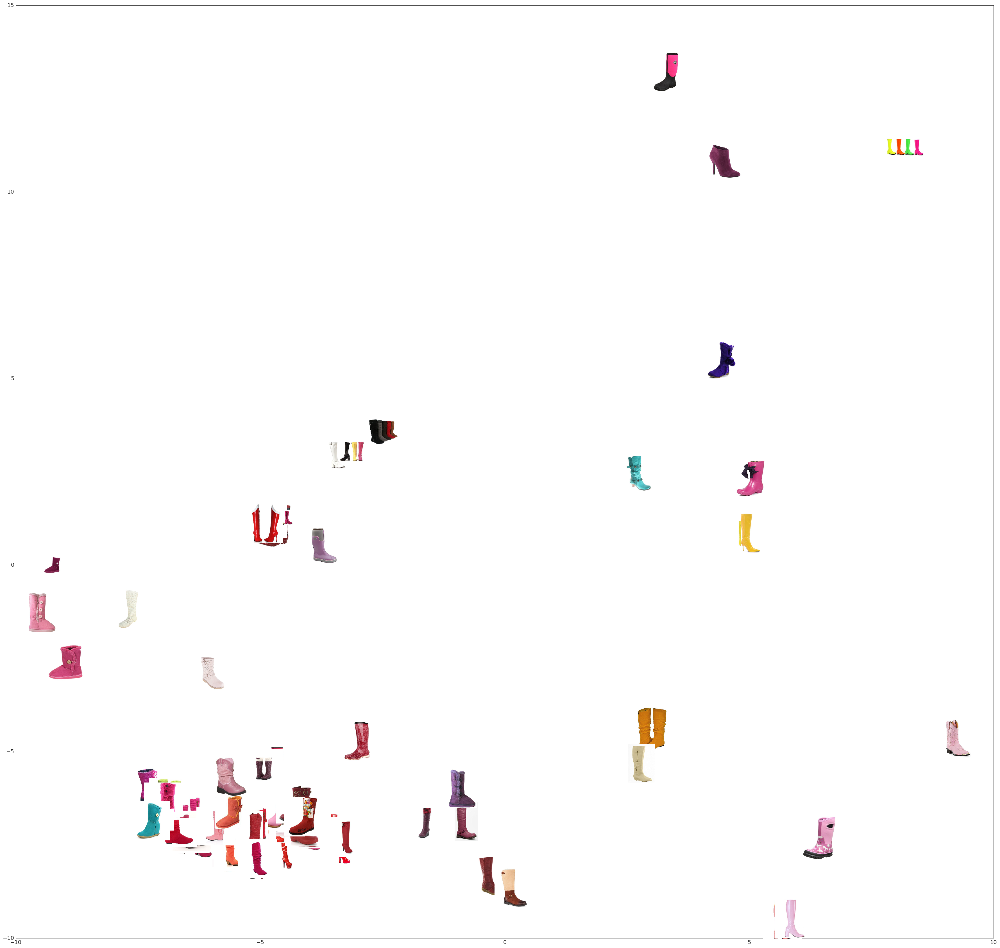

In [265]:
clusternum = 6
zoom = 0.35
nimages = 500

tsne_plot(clusternum, nimages, zoom)

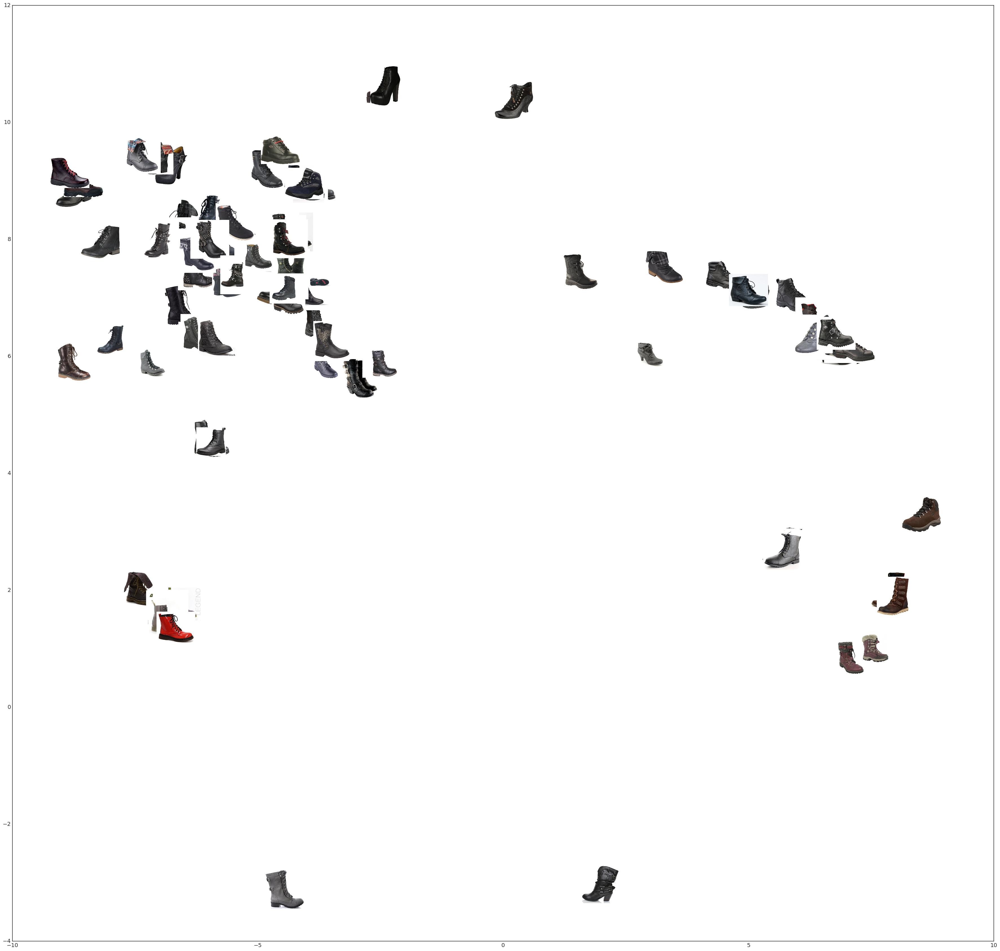

In [268]:
clusternum = 23
zoom = 0.35
nimages = 500

tsne_plot(clusternum, nimages, zoom)

In [105]:
tsne.head()

,x,y,imUrl,cluster
B0002KZ0QM,7.612138,6.282985,http://ecx.images-amazon.com/images/I/5184vXiM...,4
B0002TTZ1E,9.236236,-4.636588,http://ecx.images-amazon.com/images/I/41MES3xW...,1
B0002TU1VW,8.907090,3.833452,http://ecx.images-amazon.com/images/I/51GL4fJC...,2
B0002Z1LHO,-1.046345,2.514555,http://ecx.images-amazon.com/images/I/31eFXmVr...,4
B0006FKEWI,5.130365,2.958343,http://ecx.images-amazon.com/images/I/41Q8i8-u...,3


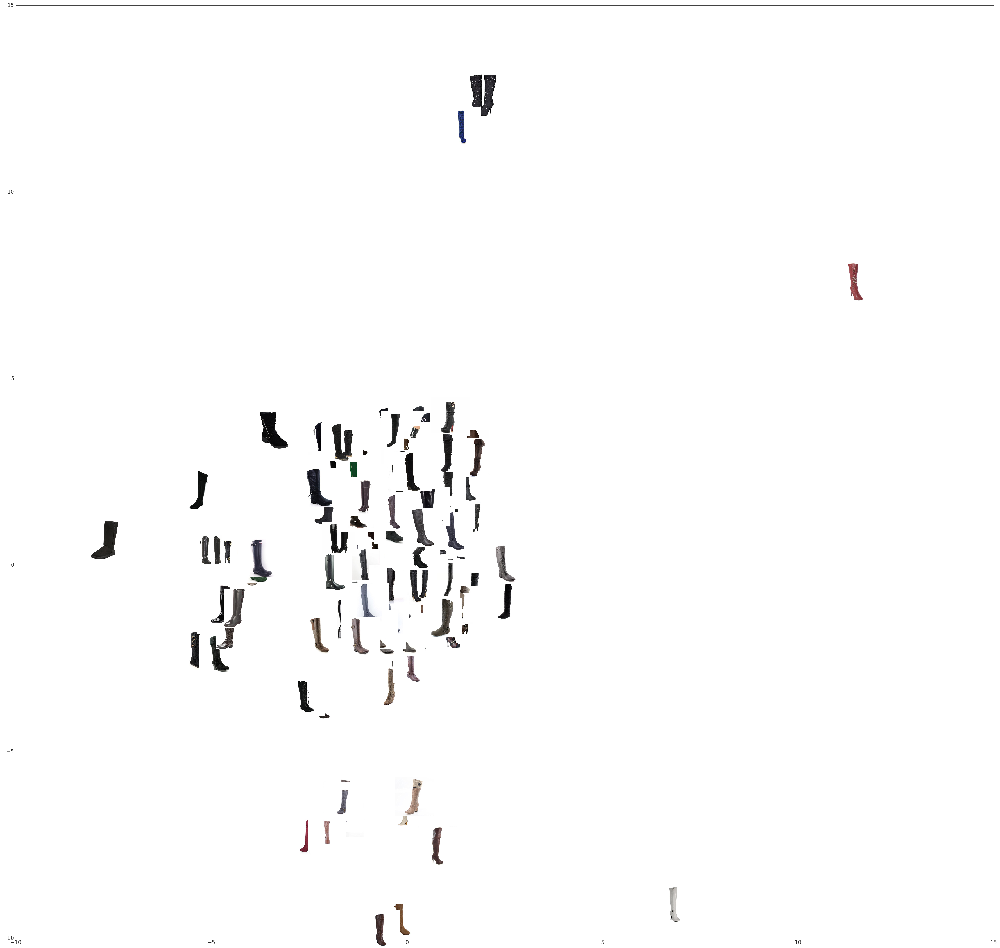

In [267]:
clusternum = 24
zoom = 0.35
nimages = 500

tsne_plot(clusternum, nimages, zoom)

In [219]:
asin = tsne.index[0]
url = tsne.loc[asin, 'imUrl']
image = io.imread(url)

In [220]:
image.shape

(395, 395, 3)

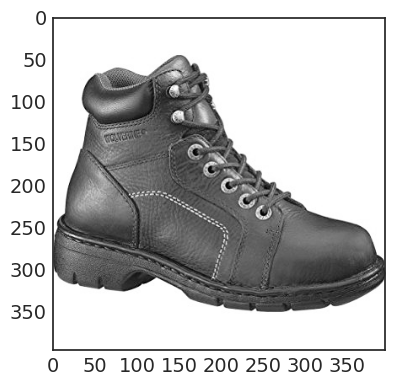

In [222]:
from skimage import color

plt.imshow(255-color.rgb2gray(image))
plt.show()

In [269]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,4086,4087,4088,4089,4090,4091,4092,4093,4094,4095
asin,,,,,,,,,,,,,,,,,,,,,
B005IYS5ZA,0.0,0.8051,0.0000,0.0,0.000,0.1,0.0000,0.3484,0.0000,1.3334,...,0.0000,0.0,0.0,0.0,0.0000,3.2731,0.0,0.0507,0.0,0.0000
B007KHXTXQ,0.0,0.0000,2.9935,0.0,1.199,0.0,0.0000,0.0000,2.8597,0.0000,...,0.0000,0.0,0.0,0.0,2.6146,0.0000,0.0,0.0201,0.0,0.0000
B00IA6VTO2,0.0,3.2722,0.0000,0.0,0.000,0.0,0.3835,0.0000,0.0000,0.0000,...,3.5435,0.0,0.0,0.0,0.0000,0.7942,0.0,0.0000,0.0,0.0000
B0091UELGO,0.0,0.0000,0.0000,0.0,0.000,0.0,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0,0.0,0.0,0.0000,0.0753,0.0,0.0000,0.0,2.6916
B006CB31NO,0.0,0.0000,0.0000,0.0,0.000,0.0,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0,0.0,0.0,0.0000,1.2655,0.0,0.0000,0.0,3.5446
